In [1]:
%reload_ext autoreload
%autoreload 2

# general
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import cKDTree
import geopandas as gpd
import matplotlib.colors as mpl_colors
from tqdm.auto import tqdm


# custom
from src import config
from src.plots import plot_utils
from src.processing import processdata, mpkx_loading

# TODO: standardise plot colors to Wes Anderson!

## Economic data

Loading the tables and combining into a single dataframe from which I can do comparisons across countries (e.g. wrt their GDP) in order to find differences via suitability deltas


Extracted mpkx file to /Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/Paper_Conferences/reef_cover_economics/data/economics/CR_Fisheries_Shoreline_Protection
Layer ntl_barrier3_pt already exists as a parquet file. Skipping extraction...
Layer NTL_spared_pos_pts already exists as a parquet file. Skipping extraction...
Layer NTL_R_Fring_DEC already exists as a parquet file. Skipping extraction...
Layer pop_spared_Pos_PTS already exists as a parquet file. Skipping extraction...
Layer GDP_spared_PT already exists as a parquet file. Skipping extraction...
Layer POP_R_Fringe_PT already exists as a parquet file. Skipping extraction...
Layer POP_R_Barrier_PT already exists as a parquet file. Skipping extraction...
Layer GDP_R_Fringe_PT already exists as a parquet file. Skipping extraction...
Layer GDP_R_Barrier_PT already exists as a parquet file. Skipping extraction...

	There are 423325 points (49.39%) that are not assigned to a country across all the layers
C

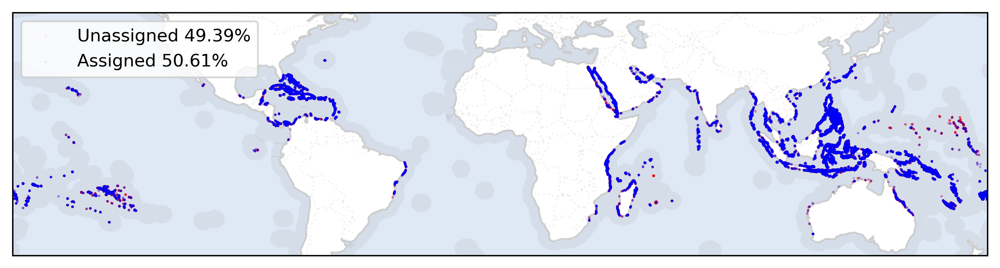

Assigning nearest country: 100%|██████████| 18/18 [00:38<00:00,  2.14s/it]



	There are 0 points remaining (0.00%) that are not assigned to a country across all the layers


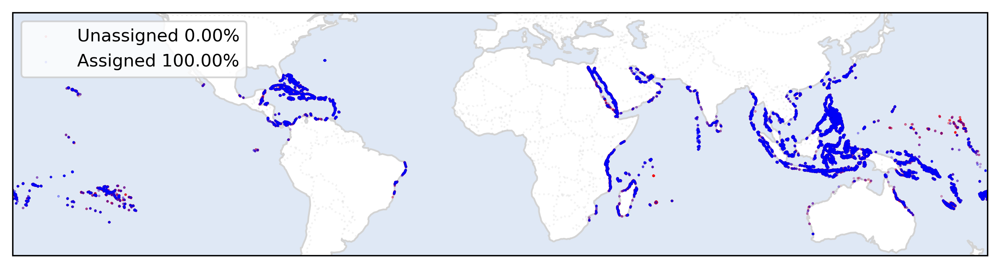

In [4]:
### tourism
# create parquet files from mpkx file (if not already created)
mpkx_loading.load_mpkx(
    config.economics_data_dir / "CR_Fisheries_Shoreline_Protection.mpkx"
)

# parquet files to read in
geoparquet_dir = (
    config.economics_data_dir / "CR_Fisheries_Shoreline_Protection" / "geoparquet"
)
geoparquet_fnames = [
    "GDP_spared_PT",
    "pop_spared_Pos_PTS",
    "NTL_spared_pos_pts",
]  # these reflect original names as extracted by unzipping the mpkx file

geoparquet_fps = [geoparquet_dir / f"{fname}.parquet" for fname in geoparquet_fnames]

# read in parquet files
gdf_list = [
    gpd.read_parquet(fp)
    .to_crs(epsg=4326)
    .rename(columns={"grid_code": f"{fname.split('_')[0].lower()}"})
    for fp, fname in zip(geoparquet_fps, geoparquet_fnames)
]

eez_gdf = gpd.read_file(
    config.geographic_dir / "World_EEZ_v12_20231025_LR" / "eez_v12_lowres.gpkg"
)

# for each gdf in the list, assign to the country it is within, making columns lower case
gdf_list = [
    processdata.assign_points_to_region_by_within(
        gdf, eez_gdf[["TERRITORY1", "geometry", "AREA_KM2", "ISO_TER1"]]
    )
    .rename(columns={"TERRITORY1": "country", "ISO_TER1": "iso_a3"})
    .rename(columns=str.lower)
    for gdf in gdf_list
]  # N.B. this is the same matching method as used to assign the ecoregions
# for each gdf in the list, fill in any nans by getting the closest country

num_unassigned = np.sum([np.sum((gdf.country.isna())) for gdf in gdf_list])
num_total = np.sum([len(gdf) for gdf in gdf_list])
print(
    f"\n\tThere are {num_unassigned} points ({num_unassigned / num_total * 100:.2f}%) that are not assigned to a country across all the layers"
)
print("Continuing to fill the remaining points with the nearest country logic...")

# plot regions and their points missing country assignment
fig, ax = plot_utils.generate_geo_axis()
ax = plot_utils.format_geo_axes(ax)
assigned_pts = gdf_list[0].loc[
    gdf_list[0].country.notna()
]  # TODO: assuming this is representative of all the gdfs
unassigned_pts = gdf_list[0].loc[gdf_list[0].country.isna()]

# plot eezs and their points missing country assignment
eez_gdf.plot(ax=ax, color="grey", alpha=0.1)
unassigned_pts.plot(
    ax=ax,
    color="red",
    markersize=0.1,
    alpha=0.1,
    label=f"Unassigned {num_unassigned / num_total * 100:.2f}%",
)
assigned_pts.plot(
    ax=ax,
    color="blue",
    markersize=0.1,
    alpha=0.1,
    label=f"Assigned {(num_total - num_unassigned) / num_total * 100:.2f}%",
)
plt.legend()
plt.show()

# load countries shapes
countries_gdf = gpd.read_file(
    config.geographic_dir / "ne_10m_admin_0_countries" / "ne_10m_admin_0_countries.shp"
)[["NAME", "ISO_A3", "geometry"]]
countries_gdf.rename(columns={"NAME": "country", "ISO_A3": "iso_a3"}, inplace=True)


# TODO: this shouldn't be necessary (but intersecting misses many points)
all_gdf = []
for gdf in gdf_list:
    all_gdf.append(processdata.assign_country_by_nearest(gdf, countries_gdf))
# N.B. this leaves some country areas (actually EEZ areas) as nans

assigned_pts = gdf_list[0].loc[gdf_list[0].country.notna()]
unassigned_pts = gdf_list[0].loc[gdf_list[0].country.isna()]

num_unassigned = np.sum([np.sum((gdf.country.isna())) for gdf in all_gdf])
num_total = np.sum([len(gdf) for gdf in all_gdf])
print(
    f"\n\tThere are {num_unassigned} points remaining ({num_unassigned / num_total * 100:.2f}%) that are not assigned to a country across all the layers"
)
# plot eezs and (any remaining) points missing country assignment
fig, ax = plot_utils.generate_geo_axis()
ax = plot_utils.format_geo_axes(ax)
unassigned_pts.plot(
    ax=ax,
    color="red",
    markersize=0.1,
    alpha=0.1,
    label=f"Unassigned {num_unassigned / num_total * 100:.2f}%",
)
assigned_pts.plot(
    ax=ax,
    color="blue",
    markersize=0.1,
    alpha=0.1,
    label=f"Assigned {(num_total - num_unassigned) / num_total * 100:.2f}%",
)
plt.legend()
plt.show()

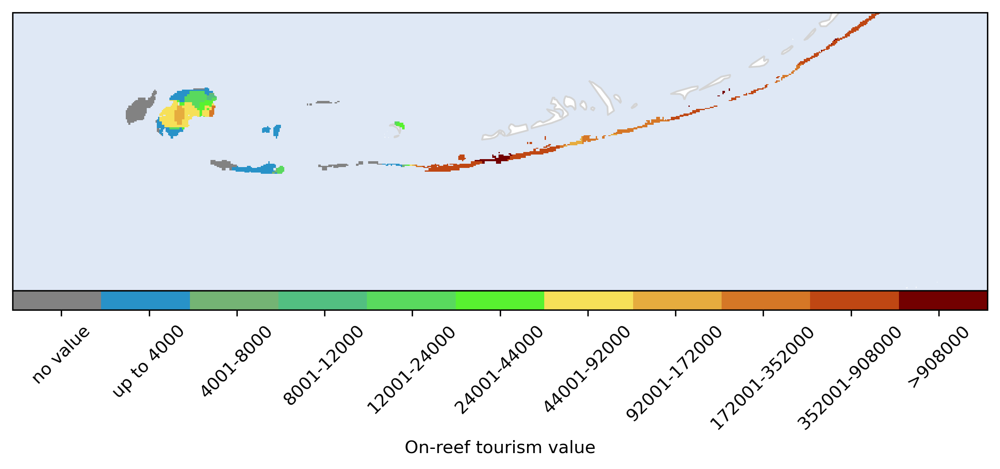

In [5]:
from shapely.geometry import box
import matplotlib.cm as cm
import numpy as np
from matplotlib.colors import Normalize
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap


tourism_gdp_gdf = (
    gpd.read_file(
        config.tourism_dir
        / "total"
        / "Coral_Reef_Tourism_Global_Total_Dollar_Value.shp"
    )
    .to_crs(epsg=4326)
    .rename(columns=str.lower)
)

prices_key = [
    "no value",
    "up to 4000",
    "4001-8000",
    "8001-12000",
    "12001-24000",
    "24001-44000",
    "44001-92000",
    "92001-172000",
    "172001-352000",
    "352001-908000",
    ">908000",
]
approx_prices = [
    0,
    2000,
    6000,
    10000,
    18000,
    34000,
    68000,
    132000,
    262000,
    630000,
    908000,
]

tourism_gdp_gdf["total_reef_value"] = prices_key
tourism_gdp_gdf["approx_price"] = approx_prices
# Each entry in this list is a color for one price bin.
colormap = [
    "#828282",  # Bin 0
    "#2892c8",  # Bin 1
    "#74b474",  # Bin 2
    "#52bf81",  # Bin 3
    "#59d95e",  # Bin 4
    "#58f230",  # Bin 5
    "#f6e058",  # Bin 6
    "#e6ac3e",  # Bin 7
    "#d57726",  # Bin 7
    "#bf4713",  # Bin 8
    "#730000",  # Bin 9
]
price_cmap = ListedColormap(colormap)

# Define the Caribbean bounding box as a Polygon
caribbean_bounds = box(-85, 0, -60, 30)  # (minx, miny, maxx, maxy)

# Filter multipolygon geometries that intersect the Caribbean area
caribbean_on_reef = tourism_gdp_gdf[
    tourism_gdp_gdf.geometry.intersects(caribbean_bounds)
]

fig, ax = plot_utils.generate_geo_axis()
ax = plot_utils.format_geo_axes(ax)

collection = caribbean_on_reef.plot(
    ax=ax,
    column="bin_global",
    cmap=price_cmap,
    legend=False,
    linewidth=0.2,
    edgecolor=None,
    # legend_kwds={'label': 'On-reef tourism value', 'orientation': 'horizontal'},
)

norm = Normalize(
    vmin=caribbean_on_reef["bin_global"].min(),
    vmax=caribbean_on_reef["bin_global"].max(),
)
sm = cm.ScalarMappable(cmap=price_cmap, norm=norm)
sm.set_array([])
cb = fig.colorbar(
    sm,
    ax=ax,
    label="On-reef tourism value",
    orientation="horizontal",
    pad=0,
    aspect=50,
    ticks=np.linspace(0.5, 9.5, len(approx_prices)),
)
cb.set_ticklabels(prices_key)
cb.ax.tick_params(rotation=45)
# zooming in to compare with the maps online at (Data Layers for Global Recreation and Tourism Coral Reefs) for Ocean Wealth
ax.set_xlim(-83.5, -80)
ax.set_ylim(24, 25)
plt.show()

In [7]:
import geopandas as gpd
from shapely.strtree import STRtree

gdf = tourism_gdp_gdf

countries = gpd.read_file(
    config.geographic_dir / "ne_10m_admin_0_countries" / "ne_10m_admin_0_countries.shp"
)[["NAME", "ISO_A3", "geometry"]].rename(columns=str.lower)

# Reproject both gdf and countries to a projected CRS for accurate centroids
projected_crs = "EPSG:6933"
gdf_proj = gdf.to_crs(projected_crs)
countries_proj = countries.to_crs(projected_crs)

# Explode MultiPolygons to individual polygons
gdf_exploded_proj = gdf_proj.explode(index_parts=False).reset_index(drop=True)

# Assign country to each polygon using centroids (in projected CRS)
centroids_proj = gdf_exploded_proj.geometry.centroid
gdf_centroids_proj = gpd.GeoDataFrame(
    gdf_exploded_proj.drop(columns=["geometry"]),
    geometry=centroids_proj,
    crs=projected_crs,
)

# Spatial join using projected centroids and countries (in projected CRS)
tourism_value_gdf_proj = gpd.sjoin(
    gdf_centroids_proj, countries_proj, how="left", predicate="within"
)

# Ensure we have both 'ISO_A3' and 'country' columns for later
if "country" not in tourism_value_gdf_proj.columns:
    tourism_value_gdf_proj["country"] = tourism_value_gdf_proj["name"]

# Handle ocean polygons
ocean_mask = tourism_value_gdf_proj["iso_a3"].isna()
if ocean_mask.sum() > 0:
    tree = STRtree(countries_proj.geometry.values)
    ocean_centroids_proj = tourism_value_gdf_proj.loc[ocean_mask, "geometry"].values
    # Find the nearest country geometry for each ocean centroid
    nearest_idx = tree.query_nearest(
        ocean_centroids_proj, return_distance=False, all_matches=False
    )[1, :]
    # Assign NAME and ISO_A3 from those nearest features
    tourism_value_gdf_proj.loc[ocean_mask, "iso_a3"] = countries_proj.iloc[nearest_idx][
        "iso_a3"
    ].values
    tourism_value_gdf_proj.loc[ocean_mask, "country"] = countries_proj.iloc[
        nearest_idx
    ]["name"].values
    # N.B. geometric informatoin currently just being duplicated to each row

# After the above, make sure any still-NaN 'country' fields fall back to 'NAME' (shouldn't be needed, but covers edge cases)
if "name" in tourism_value_gdf_proj.columns:
    nan_country = tourism_value_gdf_proj["country"].isna()
    tourism_value_gdf_proj.loc[nan_country, "country"] = tourism_value_gdf_proj.loc[
        nan_country, "name"
    ]

# Restore geometry column to original (WGS84, EPSG:4326), and columns of the original exploded GeoDataFrame
gdf_exploded = (
    gdf.to_crs(countries.crs).explode(index_parts=False).reset_index(drop=True)
)
tourism_value_gdf = tourism_value_gdf_proj.copy()
tourism_value_gdf["geometry"] = gdf_exploded.geometry.values
tourism_value_gdf = tourism_value_gdf.set_crs(countries.crs)
tourism_value_gdf.rename(columns=str.lower, inplace=True)
tourism_value_gdf.drop(columns=["index_right"], inplace=True)

In [8]:
# TODO: these differ a fair bit from Table 2. Likely due to the use of median of bins rather than raw data. Will be fine for now - currently a factor of 10 too low.
# TODO: what are sum_no_cel and sum_gridco? sum_gridco is in ballpark (and ~proportional to the approx_price) of prices. See:
# fig, ax = plt.subplots(figsize=(10, 6))
# ax.scatter(tourism_value_gdf.sum_gridco, tourism_value_gdf.approx_price)
# ax.set_aspect("equal")

# TODO: could split into on-reef and off-reef and make assumption that more of the off-reef will stay (since things will still look pretty from the surface/have the historic facilities/connections)
tourism_value_gdf.groupby("country")["approx_price"].sum().sort_values(
    ascending=False
).head(10)

country
Indonesia      879224000
Philippines    457622000
Maldives       379406000
Australia      346890000
Thailand       288148000
Egypt          272266000
Brazil         204234000
Malaysia       203188000
Puerto Rico    184882000
Japan          162508000
Name: approx_price, dtype: int64

In [9]:
# select useful columns
tourism_value_cols = [
    "country",
    "total_reef_value",
    "approx_price",
    "iso_a3",
    "geometry",
]

total_tourism_value_gdf = tourism_value_gdf[tourism_value_cols]
# Also include iso_a3 and country cols (keep the first of each), along with approx_price sum
by_country_tourism_value = (
    (
        total_tourism_value_gdf.groupby("country").agg(
            approx_price=("approx_price", "sum"),
            iso_a3=("iso_a3", "first"),
        )
    )
    .reset_index()
    .set_index("iso_a3")
)
by_country_tourism_value["approx_price"] = (
    by_country_tourism_value["approx_price"] * 10
)  # TODO: dodgy, getting to match better with figures/paper
by_country_tourism_value.head()

,country,approx_price
iso_a3,,
ASM,American Samoa,4720000
AIA,Anguilla,79820000
ATG,Antigua and Barb.,272820000
ABW,Aruba,15380000
-99,Ashmore and Cartier Is.,0


In [ ]:
# # total_tourism_value_gdf.groupby("country")["approx_price_corrected"].sum().sort_values(ascending=False).head(10)
# total_tourism_value_gdf["approx_price_corrected"].sum() / 1e9
# # TODO: this isn't matching with implementation

# total_tourism_value_gdf.country.value_counts()    # correct
total_tourism_value_gdf["approx_price"].sum() / 1e9  # correct

np.float64(5.853396)

In [10]:
# load GDP
gdp_fp = (
    config.gdp_dir
    / "API_NY.GDP.MKTP.CD_DS2_en_csv_v2_2"
    / "API_NY.GDP.MKTP.CD_DS2_en_csv_v2_2.csv"
)

gdp_df = pd.read_csv(gdp_fp, skiprows=3).rename(columns=str.lower)
gdp_df.index = gdp_df["country code"]
gdp_df.drop(columns=["country code"], inplace=True)
gdp_df.head()


,country name,indicator name,indicator code,1960,1961,1962,1963,1964,1965,1966,...,2016,2017,2018,2019,2020,2021,2022,2023,2024,unnamed: 69
country code,,,,,,,,,,,,,,,,,,,,,
ABW,Aruba,GDP (current US$),NY.GDP.MKTP.CD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.983637e+09,3.092428e+09,3.276188e+09,3.346623e+09,2.471419e+09,2.880903e+09,3.324034e+09,3.834730e+09,4.265651e+09,NaN
AFE,Africa Eastern and Southern,GDP (current US$),NY.GDP.MKTP.CD,2.420569e+10,2.495889e+10,2.707323e+10,3.176914e+10,3.027955e+10,3.380618e+10,3.692725e+10,...,8.318681e+11,9.780765e+11,1.020956e+12,1.018715e+12,9.386076e+11,1.114145e+12,1.228968e+12,1.179359e+12,1.242694e+12,NaN
AFG,Afghanistan,GDP (current US$),NY.GDP.MKTP.CD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.811657e+10,1.875346e+10,1.805322e+10,1.879944e+10,1.995593e+10,1.426000e+10,1.449724e+10,1.715223e+10,NaN,NaN
AFW,Africa Western and Central,GDP (current US$),NY.GDP.MKTP.CD,1.190481e+10,1.270772e+10,1.363059e+10,1.446891e+10,1.580356e+10,1.692088e+10,1.803395e+10,...,7.000282e+11,6.940513e+11,7.778403e+11,1.026996e+12,9.637847e+11,1.026651e+12,1.063649e+12,9.382384e+11,7.363850e+11,NaN
AGO,Angola,GDP (current US$),NY.GDP.MKTP.CD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.987825e+10,8.437694e+10,8.951279e+10,8.073443e+10,5.885246e+10,7.955954e+10,1.312122e+11,1.071677e+11,1.009989e+11,NaN


In [11]:
# read in all rows as floats apart from iso_country and country

# float_cols =
appendix_summary_df = pd.read_csv(
    config.tourism_dir / "A1_summary_data.csv",
).rename(columns=str.lower)
str_cols = ["iso_country", "country"]
float_cols = list(set(appendix_summary_df.columns) - set(str_cols))
for col in float_cols:
    appendix_summary_df[col] = appendix_summary_df[col].replace({",": ""}, regex=True)
    appendix_summary_df[col] = pd.to_numeric(appendix_summary_df[col], errors="coerce")


In [12]:
for col in appendix_summary_df.columns[
    appendix_summary_df.columns.str.contains("(1000)")
]:
    appendix_summary_df[col] = appendix_summary_df[col] * 1000
    appendix_summary_df.rename(columns={col: col.replace(" (1000)", "")}, inplace=True)

# assign each row in appendix_summary_df to iso_a3 by looking up value for country column
iso_a3_map = countries_gdf.set_index("country")["iso_a3"]
appendix_summary_df["iso_a3"] = appendix_summary_df["iso_country"].map(iso_a3_map)
# combine US rows: United States (Florida) and United States (Hawaii)

# TODO: some are missing values. Should prioritise finding these (the ones without iso_a3 codes because e.g. 'belong' to another country)
appendix_summary_df = appendix_summary_df[appendix_summary_df["iso_a3"] != "-99"]

us_rows = appendix_summary_df[
    appendix_summary_df["iso_country"].fillna("").str.contains("United States")
]
us_rows_indices = us_rows.index
us_rows = us_rows.sum()
us_rows
us_rows["iso_a3"] = "USA"
us_rows["iso_country"] = "United States"
us_rows["country"] = "United States"

# replace original US rows with this new 'United States' row
appendix_summary_df = appendix_summary_df.drop(us_rows_indices)
# Recombine the US rows with appendix_summary_df, aligning columns and filling missing values with NaN
appendix_summary_df = pd.concat(
    [appendix_summary_df, pd.DataFrame(us_rows).T], ignore_index=True, sort=False
)
appendix_summary_df.set_index("iso_a3", inplace=True)

/var/folders/tp/x_9dbyf149d6kw_k79l_kk4m0000gq/T/ipykernel_46469/2358386721.py:2: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  appendix_summary_df.columns.str.contains("(1000)")


In [13]:
merged = (
    by_country_tourism_value.merge(
        appendix_summary_df, left_index=True, right_index=True
    )
    .drop(columns=["country_x"])
    .rename(columns={"country_y": "country"})
)
merged["proportion"] = (
    merged["approx_price"] / merged["sum of reef-associated visitor expenditure"]
)
# multiply each "approx_price" value in total_tourism_value_gdf by 'proportion' for the relevant country. Map the proportion from merged ("proportion" indexed by country/iso_a3) using total_tourism_value_gdf["iso_a3"]
total_tourism_value_gdf.loc[:, "approx_price_corrected"] = total_tourism_value_gdf[
    "approx_price"
] * total_tourism_value_gdf["iso_a3"].map(merged["proportion"])

# group by country and sum the approx_price_corrected
corrected_by_country_tourism_value_gdp = total_tourism_value_gdf.groupby("country")[
    "approx_price_corrected"
].sum()
# total_tourism_value_gdf.groupby("country")["approx_price_corrected"].sum()


/Users/rt582/miniforge3/envs/economics-hbb/lib/python3.14/site-packages/geopandas/geodataframe.py:1969: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
merged["approx_price"]


In [14]:
# by_country_tourism_value["corrected_approx_price_check"] = (
# by_country_tourism_value["approx_price"] * by_country_tourism_value["proportion"]
# ) # TODO: add check
by_country_tourism_value["approx_price_corrected"] = (
    total_tourism_value_gdf.groupby("country")["approx_price_corrected"].sum().values
)

by_country_tourism_value


,country,approx_price,approx_price_corrected
iso_a3,,,
ASM,American Samoa,4720000,0
AIA,Anguilla,79820000,32365925.323851
ATG,Antigua and Barb.,272820000,112700441.227685
ABW,Aruba,15380000,108394.233501
-99,Ashmore and Cartier Is.,0,0
...,...,...,...
VUT,Vanuatu,213780000,91420232.44184
VEN,Venezuela,970400000,334087651.89009
VNM,Vietnam,847200000,522207312.015715


In [15]:
gdp_at_time_of_valuation = gdp_df[str(2017)]  # TODO: sort dtypes

# merge gdp with tourism value
corrected_by_country_tourism_value_gdp = by_country_tourism_value.merge(
    gdp_at_time_of_valuation, left_index=True, right_index=True
).rename(columns={"2017": "national_gdp"})
# by_country_tourism_value.rename(columns={"gdp": "reef_tourism_gdp"}, inplace=True)

corrected_by_country_tourism_value_gdp["reef_tourism_gdp_as_pct_of_national_gdp"] = (
    100
    * corrected_by_country_tourism_value_gdp["approx_price_corrected"]
    / corrected_by_country_tourism_value_gdp["national_gdp"]
)


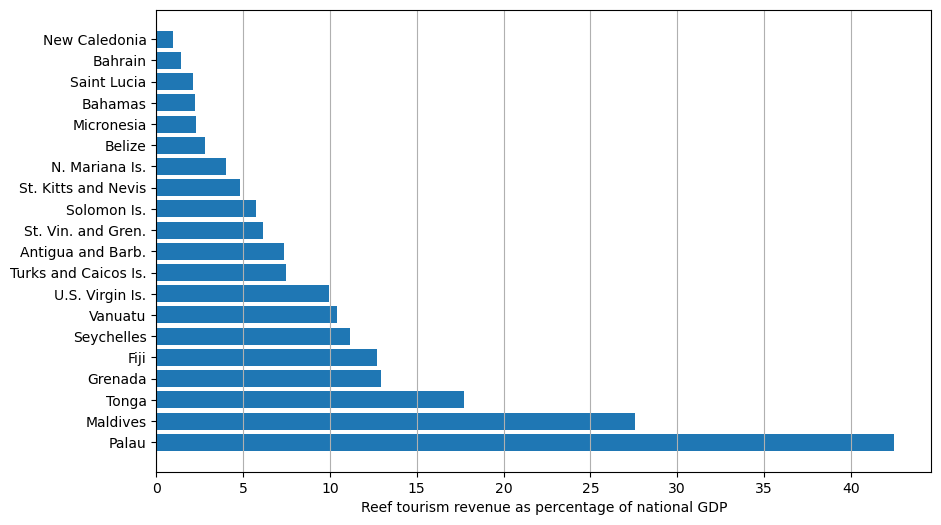

In [ ]:
# plot the top 10 countries by reef tourism GDP as a percentage of national GDP
#  TODO: these results don't match the proportions in the paper but aren't bad
fig, ax = plt.subplots(figsize=(10, 6))
corrected_by_country_tourism_value_gdp.sort_values(
    by="reef_tourism_gdp_as_pct_of_national_gdp", ascending=False, inplace=True
)

n_display = 20
ax.barh(
    corrected_by_country_tourism_value_gdp.country[:n_display],
    corrected_by_country_tourism_value_gdp["reef_tourism_gdp_as_pct_of_national_gdp"][
        :n_display
    ],
)
ax.grid(True, axis="x")
ax.set_xlabel("Reef tourism revenue as percentage of national GDP")
plt.show()


In [ ]:
# plot a global choropleth of the reef tourism GDP as a percentage of national GDP on a logarithmic color scale

import plotly.graph_objects as go
import plotly.express as px
import numpy as np


# Take absolute, but replace 0 values (log undefined) - set to nan or a minimum small value (e.g. 1e-2)
z_data = corrected_by_country_tourism_value_gdp[
    "reef_tourism_gdp_as_pct_of_national_gdp"
].copy()
z_data_safe = z_data.replace(0, np.nan)
min_val = z_data_safe[z_data_safe > 0].min() if (z_data_safe > 0).any() else 1e-2
z_data_safe = z_data_safe.fillna(min_val)

hover_text = [
    f"{row['country']}<br>Contribution to GDP: {row['reef_tourism_gdp_as_pct_of_national_gdp']:.2f}"
    for _, row in corrected_by_country_tourism_value_gdp.iterrows()
]

fig = go.Figure(
    data=go.Choropleth(
        locations=corrected_by_country_tourism_value_gdp.index,
        z=np.log10(z_data_safe),
        text=hover_text,
        hovertemplate="%{text}<extra></extra>",
        colorscale=px.colors.sequential.Plasma,
        colorbar=dict(
            title="Contribution to GDP (%)",
            tickvals=np.log10([1e-2, 0.1, 1, 10, 100]),  # adjust based on range
            ticktext=[f"{v:.2g}%" for v in [1e-2, 0.1, 1, 10, 100]],
        ),
        zmin=np.log10(min_val),
        zmax=np.log10(z_data_safe.max()),
    )
)
fig.update_traces(colorbar={"orientation": "h", "x": 0.5, "y": -0.2, "len": 0.6})

fig.update_layout(
    geo=dict(
        showcoastlines=True,
        showland=True,
    ),
    title=dict(
        text="Contribution of reefs to GDP by country<br>(logarithmic color scale)",
        x=0.5,
        y=0.95,
        xanchor="center",
        yanchor="top",
    ),
    margin=dict(l=0, r=0, t=50, b=0),
    autosize=True,
)

fig.show()


### plot a chloropleth of the per-country contribution to GDP
def human_readable_number(x, num_sf: int = 2):
    """Format very large numbers as 'millions' or 'billions'"""
    if x >= 1e9:
        return f"{x / 1e9:.{num_sf}f} billion"
    elif x >= 1e6:
        return f"{x / 1e6:.{num_sf}f} million"
    else:
        return f"{x:.{num_sf}f}"


# Format hover text in scientific format (e.g. 1.23e-2)
hover_text = [
    f"{row['country']}<br>Contribution to GDP: {human_readable_number(row['approx_price_corrected'])}"
    for _, row in corrected_by_country_tourism_value_gdp.iterrows()
]


tickvals = np.arange(
    0, corrected_by_country_tourism_value_gdp["approx_price_corrected"].max(), 5e8
)
ticktext = [human_readable_number(v, 0) for v in tickvals]
fig = go.Figure(
    data=go.Choropleth(
        locations=corrected_by_country_tourism_value_gdp.index,
        z=corrected_by_country_tourism_value_gdp["approx_price_corrected"],
        text=hover_text,
        hovertemplate="%{text}<extra></extra>",
        colorscale=px.colors.sequential.Plasma,
        colorbar=dict(
            title="Total reef-associated tourism revenue",
            tickvals=tickvals,  # adjust based on range
            ticktext=ticktext,
        ),
    )
)


fig.update_traces(colorbar={"orientation": "h", "x": 0.5, "y": -0.2, "len": 0.6})

fig.update_layout(
    geo=dict(
        showcoastlines=True,
        showland=True,
    ),
    title=dict(
        text="Contribution of reefs to GDP by country",
        x=0.5,
        y=0.95,
        xanchor="center",
        yanchor="top",
    ),
    margin=dict(l=0, r=0, t=50, b=0),
    autosize=True,
)

fig.show()


/var/folders/tp/x_9dbyf149d6kw_k79l_kk4m0000gq/T/ipykernel_46469/1769572313.py:11: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [38]:
# merge tourism_value_gdp with coral cover change
total_tourism_value_gdf


,country,total_reef_value,approx_price,iso_a3,geometry,approx_price_corrected
0,Australia,no value,0,AUS,"POLYGON ((159.08259 -29.90106, 159.08259 -29.9...",0.0
1,Australia,no value,0,AUS,"POLYGON ((159.12751 -29.42099, 159.12751 -29.4...",0.0
2,Australia,no value,0,AUS,"POLYGON ((113.90182 -28.8836, 113.90182 -28.87...",0.0
3,Australia,no value,0,AUS,"POLYGON ((114.01411 -28.86393, 114.01411 -28.8...",0.0
4,Australia,no value,0,AUS,"POLYGON ((114.04555 -28.78917, 114.04555 -28.7...",0.0
...,...,...,...,...,...,...
63175,Bermuda,>908000,908000,BMU,"POLYGON ((-64.72817 32.35622, -64.72817 32.352...",1469842.737626
63176,Bermuda,>908000,908000,BMU,"POLYGON ((-64.74614 32.37519, -64.73715 32.375...",1469842.737626
63177,Bermuda,>908000,908000,BMU,"POLYGON ((-64.74614 32.37519, -64.75512 32.375...",1469842.737626
63178,Bermuda,>908000,908000,BMU,"POLYGON ((-64.68326 32.38277, -64.68326 32.378...",1469842.737626


## Non-GDP datasets

In [20]:
# ### view the summary statistics of the different valuation datasets (economic value of infrastructure spared from flooding per decade, # of people avoiding damage from flooding per decade, NTL relative values per km of coastline)

# tourism_gdp_gdf = all_gdf[0]
# # summarise the total amount per country
# by_country_gdp = tourism_gdp_gdf.groupby("country")["gdp"].sum()
# by_country_gdp.sort_values(ascending=False).head(10)

# # plot the top 10 countries by GDP
# fig, ax = plt.subplots(figsize=(10, 6))
# by_country_gdp.sort_values(ascending=False).head(10).plot(kind="bar", ax=ax)
# ax.set_ylabel("Cost of infrastructure saved by reef")
# ax.set_title("Top 10 Countries by infrastructure cost saved by reef")
# plt.show()


## Relate to coral cover

/var/folders/tp/x_9dbyf149d6kw_k79l_kk4m0000gq/T/ipykernel_46469/2977349472.py:30: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




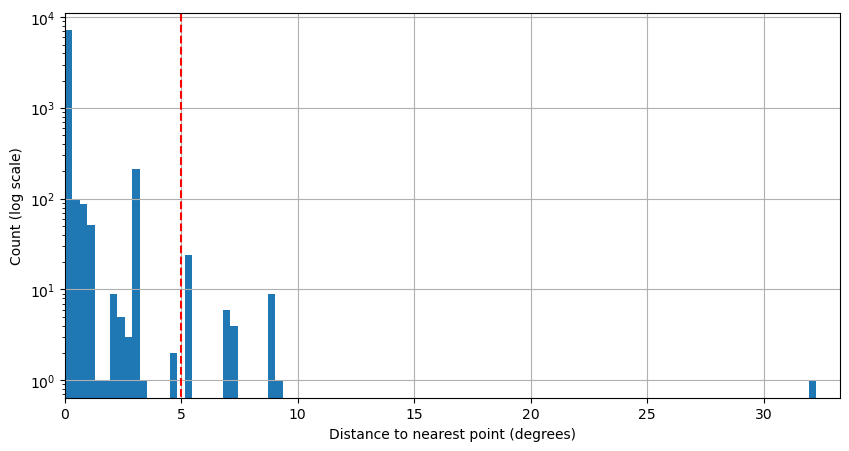

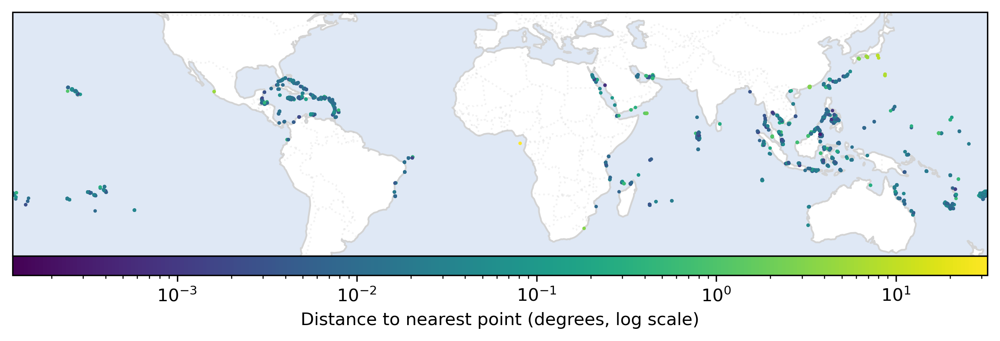

In [21]:
# Plot the top n most affected countries with two bars per country representing both RCPs at 2100, mean percentage change


### load the coral cover data
sully_results_fp = config.sully_data_dir / "data_for_maps.csv"
coral_cover_df = pd.read_csv(sully_results_fp)
# coral_cover_df.head()

# trim down to the relevant columns
meta_cols = [
    "Latitude.Degrees",
    "Longitude.Degrees",
    "Country_Name",
    "Ocean",
    "Realm",
    "Ecoregion.x",
    "Average_coral_cover",
]
prediction_cols = [col for col in coral_cover_df.columns if "future" in col]

coral_cover_df = coral_cover_df[meta_cols + prediction_cols]


### match the projected change in coral cover to each point

# Convert all_gdf[0] geometry to numpy array of (lon, lat)
# points_gdf_coords = np.array([[geom.x, geom.y] for geom in all_gdf[0].geometry.values])

points_gdf_coords = np.array(
    [[geom.x, geom.y] for geom in total_tourism_value_gdf.geometry.centroid.values]
)

# Build a KDTree for fast nearest neighbor lookup
tree = cKDTree(points_gdf_coords)

# Prepare coral locations
reef_coords = coral_cover_df[["Longitude.Degrees", "Latitude.Degrees"]].values

# Query kd-tree: distances, indices
distances, nearest_idxs = tree.query(reef_coords, k=1)

# TODO: expand this to the other dataframes
# Add columns from the closest points to df (optional: choose fields to add)
columns_to_add = ["pointid", "gdp", "country", "area_km2", "iso_a3"]
for col in columns_to_add:
    coral_cover_df[f"nearest_{col}"] = all_gdf[0].iloc[nearest_idxs][col].values

# Add distance column (distance to nearest all_gdf[0] point, in degrees)
coral_cover_df["distance_to_nearest_point"] = distances


fig, ax = plt.subplots(figsize=(10, 5))
# plot the distances between the economic data and nearest coral cover datapoint
ax.hist(coral_cover_df.distance_to_nearest_point, bins=100)
ax.set_yscale("log")
ax.set_xlabel("Distance to nearest point (degrees)")
ax.set_ylabel("Count (log scale)")
ax.vlines(
    5, 0, np.max(ax.get_ylim()), color="red", linestyle="--", label="5 degree threshold"
)
ax.set_xlim(0, np.max(coral_cover_df.distance_to_nearest_point + 1))
ax.grid(True)

# plot spatially distance to nearest point with log scale colorbar

fig, ax = plot_utils.generate_geo_axis()
ax = plot_utils.format_geo_axes(ax)

# Use scatter with norm set to log scale
norm = mpl_colors.LogNorm(
    vmin=coral_cover_df["distance_to_nearest_point"][
        coral_cover_df["distance_to_nearest_point"] > 0
    ].min(),
    vmax=coral_cover_df["distance_to_nearest_point"].max(),
)
sc = ax.scatter(
    coral_cover_df["Longitude.Degrees"],
    coral_cover_df["Latitude.Degrees"],
    c=coral_cover_df.distance_to_nearest_point,
    cmap="viridis",
    s=1,
    norm=norm,
)

cbar = plt.colorbar(
    sc,
    ax=ax,
    orientation="horizontal",
    label="Distance to nearest point (degrees, log scale)",
    pad=0,
    aspect=50,
)
plt.show()


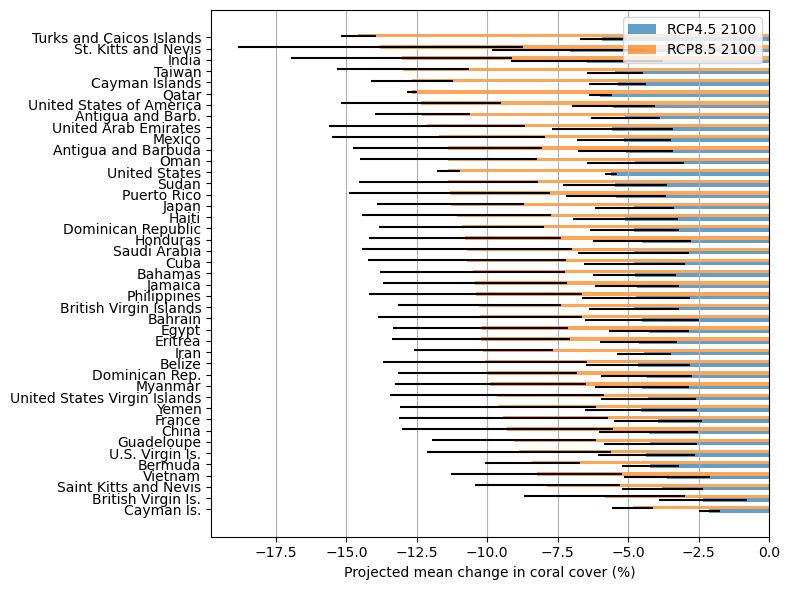

In [53]:
n = 45  # number of countries to show

# Compute mean and std change for both RCPs, cast to percent
grp = coral_cover_df.groupby("nearest_country")

mean_rcp85 = grp["Y_future_RCP85_yr_2100_change"].mean() * 100
std_rcp85 = grp["Y_future_RCP85_yr_2100_change"].std() * 100

if "Y_future_RCP45_yr_2100_change" in coral_cover_df.columns:
    mean_rcp45 = grp["Y_future_RCP45_yr_2100_change"].mean() * 100
    std_rcp45 = grp["Y_future_RCP45_yr_2100_change"].std() * 100
else:
    mean_rcp45 = None
    std_rcp45 = None

# Order countries by worst (most negative) RCP85
top_countries = mean_rcp85.sort_values().head(n).index

# Reverse the order so the most affected (largest negative change) is at the top
top_countries = top_countries[::-1]

ind = np.arange(np.min([n, len(top_countries)]))
bar_height = 0.3

fig, ax = plt.subplots(figsize=(8, 6))

y_labels = list(top_countries)
# If RCP45 is available, do 2 bars per country
ax.barh(
    ind - bar_height / 2,
    mean_rcp45.loc[top_countries],
    height=bar_height,
    xerr=std_rcp45.loc[top_countries],
    label="RCP4.5 2100",
    color="tab:blue",
    alpha=0.7,
)
ax.barh(
    ind + bar_height / 2,
    mean_rcp85.loc[top_countries],
    height=bar_height,
    xerr=std_rcp85.loc[top_countries],
    label="RCP8.5 2100",
    color="tab:orange",
    alpha=0.7,
)
ax.set_yticks(ind)
ax.set_yticklabels(y_labels)
ax.legend(loc="upper right")

ax.set_xlabel("Projected mean change in coral cover (%)")
ax.grid(axis="x")
plt.tight_layout()
plt.show()


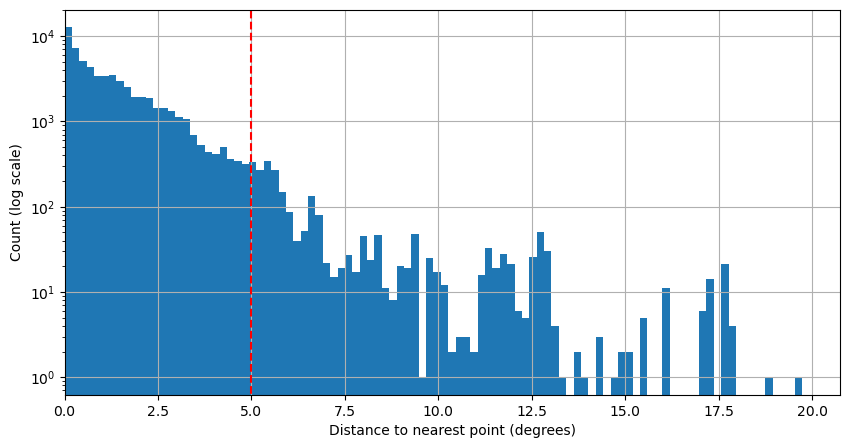

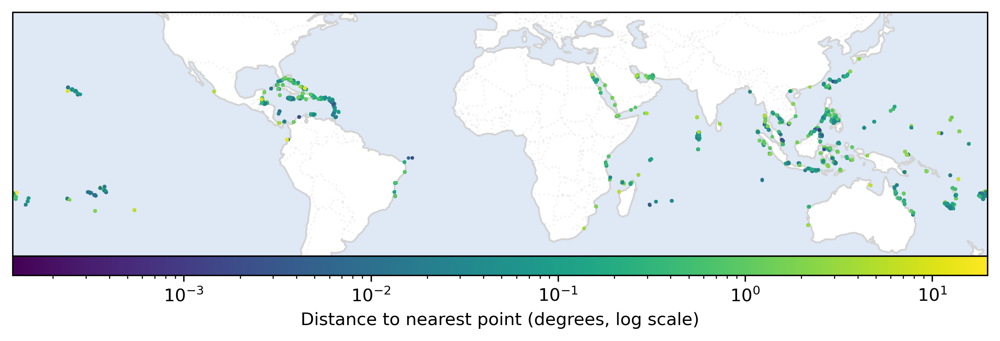

In [64]:
### match the projected change in coral cover to each economics (tourism revenue) point

# Ensure geometries are in a projected CRS before calculating centroids
if total_tourism_value_gdf.crs is None or total_tourism_value_gdf.crs.is_geographic:
    # Use a global projection if necessary; for global data, Robinson is a good compromise
    projected_crs = "ESRI:54030"
    total_tourism_value_gdf_proj = total_tourism_value_gdf.to_crs(projected_crs)
else:
    total_tourism_value_gdf_proj = total_tourism_value_gdf

# Compute projected centroids, then transform them back to WGS84 for matching (if needed)
projected_centroids = total_tourism_value_gdf_proj.geometry.centroid

# Convert centroid GeoSeries in projected CRS back to lat/lon for spatial matching
if not total_tourism_value_gdf_proj.crs.is_geographic:
    projected_centroids_gdf = gpd.GeoDataFrame(
        geometry=projected_centroids, crs=total_tourism_value_gdf_proj.crs
    )
    centroids_ll = projected_centroids_gdf.to_crs("EPSG:4326").geometry
else:
    centroids_ll = projected_centroids

economics_coords = np.array([[geom.x, geom.y] for geom in centroids_ll.values])

# Prepare coral locations (already lat/lon)
cover_coords = coral_cover_df[["Longitude.Degrees", "Latitude.Degrees"]].values

# Build a KDTree for fast nearest neighbor lookup
tree = cKDTree(cover_coords)

# Query kd-tree: distances, indices
distances, nearest_idxs = tree.query(economics_coords, k=1)

columns_to_add = [
    "Latitude.Degrees",
    "Longitude.Degrees",
    "Country_Name",
    "Ocean",
    "Realm",
    "Ecoregion.x",
    "Average_coral_cover",
    "Y_future_RCP45_yr_2050",
    "Y_future_RCP45_yr_2100",
    "Y_future_RCP85_yr_2050",
    "Y_future_RCP85_yr_2100",
    "Y_future_RCP45_yr_2050_change",
    "Y_future_RCP45_yr_2100_change",
    "Y_future_RCP85_yr_2050_change",
    "Y_future_RCP85_yr_2100_change",
]
for col in columns_to_add:
    total_tourism_value_gdf.loc[:, f"nearest_{col}"] = coral_cover_df.iloc[
        nearest_idxs
    ][col].values

# # Add distance column (distance to nearest all_gdf[0] point, in degrees)
total_tourism_value_gdf.loc[:, "distance_to_nearest_point"] = distances

fig, ax = plt.subplots(figsize=(10, 5))
# plot the distances between the economic data and nearest coral cover datapoint
ax.hist(total_tourism_value_gdf.distance_to_nearest_point, bins=100)
ax.set_yscale("log")
ax.set_xlabel("Distance to nearest point (degrees)")
ax.set_ylabel("Count (log scale)")
ax.vlines(
    5, 0, np.max(ax.get_ylim()), color="red", linestyle="--", label="5 degree threshold"
)
ax.set_xlim(0, np.max(total_tourism_value_gdf.distance_to_nearest_point + 1))
ax.grid(True)

# plot spatially distance to nearest point with log scale colorbar

fig, ax = plot_utils.generate_geo_axis()
ax = plot_utils.format_geo_axes(ax)

# Use scatter with norm set to log scale
norm = mpl_colors.LogNorm(
    vmin=total_tourism_value_gdf["distance_to_nearest_point"][
        total_tourism_value_gdf["distance_to_nearest_point"] > 0
    ].min(),
    vmax=total_tourism_value_gdf["distance_to_nearest_point"].max(),
)
sc = ax.scatter(
    total_tourism_value_gdf["nearest_Longitude.Degrees"],
    total_tourism_value_gdf["nearest_Latitude.Degrees"],
    c=total_tourism_value_gdf.distance_to_nearest_point,
    cmap="viridis",
    s=1,
    norm=norm,
)

cbar = plt.colorbar(
    sc,
    ax=ax,
    orientation="horizontal",
    label="Distance to nearest point (degrees, log scale)",
    pad=0,
    aspect=50,
)
plt.show()


import plotly.express as px

# Prepare data for plotly:
# Ensure no NaN in latitude/longitude or distance, and provide hover data
plot_df = total_tourism_value_gdf.dropna(
    subset=[
        "nearest_Longitude.Degrees",
        "nearest_Latitude.Degrees",
        "distance_to_nearest_point",
    ]
).copy()

# Choose a country column: if 'nearest_country' or 'country' exist, otherwise fallback
country_col = None
for ctry_col_candidate in ["nearest_country", "country", "assigned_country"]:
    if ctry_col_candidate in plot_df.columns:
        country_col = ctry_col_candidate
        break

if country_col is None:
    country_col = (
        plot_df.columns[plot_df.columns.str.contains("country", case=False, na=False)][
            0
        ]
        if plot_df.columns.str.contains("country", case=False, na=False).any()
        else None
    )

# Prepare the hover data
hover_data = {
    "Longitude": plot_df["nearest_Longitude.Degrees"],
    "Latitude": plot_df["nearest_Latitude.Degrees"],
    "Distance (deg)": plot_df["distance_to_nearest_point"],
}
if country_col is not None:
    hover_data["Country"] = plot_df[country_col]

# Construct interactive scatter_geo plot
fig = px.scatter_geo(
    plot_df,
    lon="nearest_Longitude.Degrees",
    lat="nearest_Latitude.Degrees",
    color="distance_to_nearest_point",
    color_continuous_scale="Viridis",
    title="Distance to Nearest Point (log scale, color) - interactive",
    hover_data=hover_data,
    size_max=25,
)

fig.update_traces(
    marker=dict(sizemode="area", size=5, opacity=0.7, line_width=0),
    selector=dict(mode="markers"),
)

fig.update_coloraxes(
    colorbar_title="Distance (deg)",
    cmin=plot_df["distance_to_nearest_point"][
        plot_df["distance_to_nearest_point"] > 0
    ].min(),
    cmax=plot_df["distance_to_nearest_point"].max(),
    colorscale="Viridis",
    # Log colorbar for distance
)

fig.update_coloraxes(
    colorscale="Viridis",
    colorbar=dict(title="Distance to nearest point (degrees, log scale)"),
    cmin=np.log10(
        plot_df["distance_to_nearest_point"][
            plot_df["distance_to_nearest_point"] > 0
        ].min()
    ),
    cmax=np.log10(plot_df["distance_to_nearest_point"].max()),
)

# Must map the color to log10 for colorbar if log scaling is strictly desired:
fig.data[0].marker.color = np.log10(plot_df["distance_to_nearest_point"])
fig.update_coloraxes(
    colorbar=dict(title="Distance to nearest point (degrees, log scale)")
)

fig.update_geos(
    showcountries=True, showcoastlines=True, projection_type="natural earth"
)
fig.update_layout(margin={"r": 0, "t": 30, "l": 0, "b": 0})
fig.show()


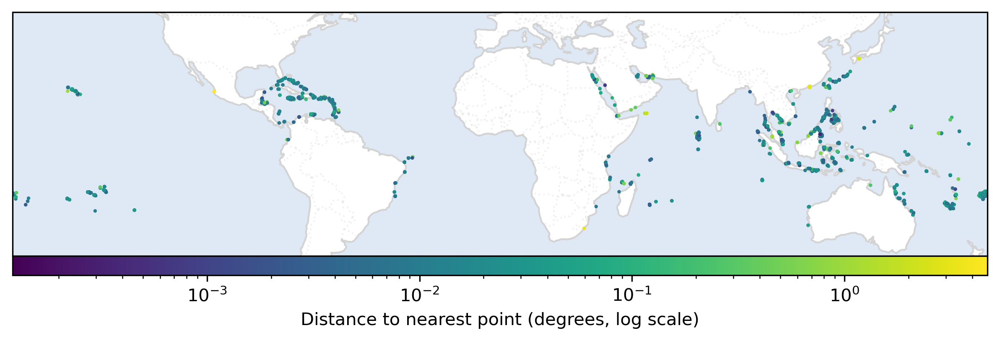

In [56]:
# trim off any points beyond 5 degrees
coral_cover_df = coral_cover_df[coral_cover_df.distance_to_nearest_point <= 5]
# replot spatial graph

fig, ax = plot_utils.generate_geo_axis()
ax = plot_utils.format_geo_axes(ax)

# Use scatter with norm set to log scale
norm = mpl_colors.LogNorm(
    vmin=coral_cover_df["distance_to_nearest_point"][
        coral_cover_df["distance_to_nearest_point"] > 0
    ].min(),
    vmax=coral_cover_df["distance_to_nearest_point"].max(),
)
sc = ax.scatter(
    coral_cover_df["Longitude.Degrees"],
    coral_cover_df["Latitude.Degrees"],
    c=coral_cover_df.distance_to_nearest_point,
    cmap="viridis",
    s=1,
    norm=norm,
)

cbar = plt.colorbar(
    sc,
    ax=ax,
    orientation="horizontal",
    label="Distance to nearest point (degrees, log scale)",
    pad=0,
    aspect=50,
)
plt.show()


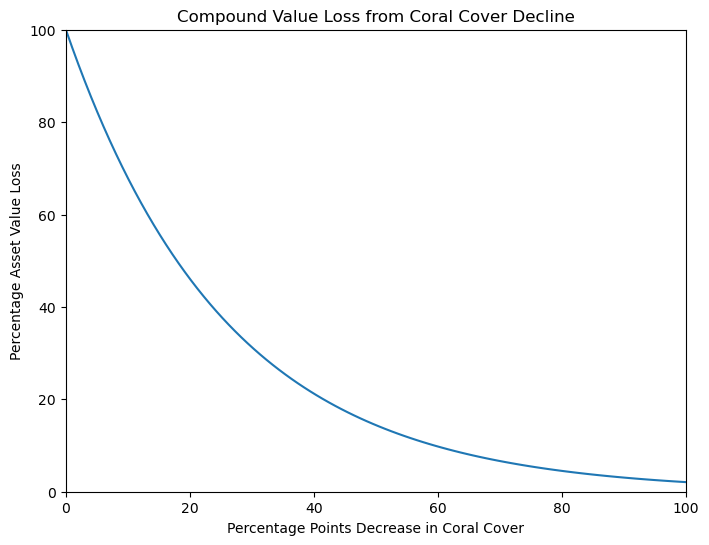

In [ ]:
### define functions to map between coral cover change and economic depreciation
def compound_value_loss(delta_cc, value):
    """
    For each 1% decrease in coral cover, the asset's value decreases by 3.8% relative to its remaining value,
    i.e., the decrease is compounded. Based on Chen et al (2014) (10.1016/j.gloenvcha.2014.10.011).

    Args:
        delta_cc: float or array-like, percentage point decrease in coral cover (e.g., 27 means -27 percentage points)
        value: float or array-like, starting asset value

    Returns:
        float or array-like: projected value after coral cover loss
    """
    return np.maximum(value * (1 - 0.038) ** delta_cc, 0)


cover_vals = np.linspace(
    0, 100, 100
)  # now up to 100% loss, consistent with compounding definition
value_loss = compound_value_loss(cover_vals, 100)

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(cover_vals, value_loss)
ax.set_xlabel("Percentage Points Decrease in Coral Cover")
ax.set_ylabel("Percentage Asset Value Loss")
ax.set_title("Compound Value Loss from Coral Cover Decline")
ax.set_ylim(0, 100)
ax.set_xlim(0, 100)
plt.show()


In [65]:
# coral_cover_df
corrected_by_country_tourism_value_gdp

,country,approx_price,approx_price_corrected,national_gdp,reef_tourism_gdp_as_pct_of_national_gdp
iso_a3,,,,,
PLW,Palau,338940000,124190916.61892,2.921486e+08,42.509504
MDV,Maldives,3794060000,1326384355.235952,4.816426e+09,27.538766
TON,Tonga,104140000,81597619.441728,4.599769e+08,17.739506
GRD,Grenada,183760000,145864957.235421,1.125685e+09,12.957882
FJI,Fiji,1263520000,680292313.82843,5.353469e+09,12.707504
...,...,...,...,...,...
TLS,Timor-Leste,41900000,0,1.584878e+09,0.0
YEM,Yemen,28760000,0,2.684223e+10,0.0
VGB,British Virgin Is.,455280000,105998403.681923,NaN,NaN


In [88]:
coral_cover_df


,Latitude.Degrees,Longitude.Degrees,Country_Name,Ocean,Realm,Ecoregion.x,Average_coral_cover,Y_future_RCP45_yr_2050,Y_future_RCP45_yr_2100,Y_future_RCP85_yr_2050,...,Y_future_RCP85_yr_2050_change,Y_future_RCP85_yr_2100_change,nearest_pointid,nearest_gdp,nearest_country,nearest_area_km2,nearest_iso_a3,distance_to_nearest_point,projected_value_loss_rcp45,projected_value_loss_rcp85
0,-21.800278,35.499722,Mozambique,Indian,Western Indo-Pacific,South Mozambique coast,0.45000,0.359012,0.321381,0.341713,...,-0.058287,-0.136525,54669,57,Puerto Rico,154661.0,PRI,0.008374,77.294822,96.733532
1,-22.258000,166.385667,New Caledonia,Pacific,Central Indo-Pacific,New Caledonia,0.55625,0.265082,0.243250,0.253030,...,-0.046970,-0.117806,54655,30,Belize,32862.0,BLZ,0.005123,37.376909,47.351069
2,-22.258000,166.385667,New Caledonia,Pacific,Central Indo-Pacific,New Caledonia,0.21250,0.292865,0.268250,0.268811,...,-0.051189,-0.125651,54655,30,Belize,32862.0,BLZ,0.005123,36.659802,48.812229
3,-22.258000,166.385667,New Caledonia,Pacific,Central Indo-Pacific,New Caledonia,0.23125,0.292555,0.275828,0.265780,...,-0.064220,-0.118008,54655,30,Belize,32862.0,BLZ,0.005123,37.005434,47.387995
4,-22.258000,166.385667,New Caledonia,Pacific,Central Indo-Pacific,New Caledonia,0.37500,0.285446,0.271347,0.269305,...,-0.050695,-0.119868,54655,30,Belize,32862.0,BLZ,0.005123,36.222563,47.730777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7709,13.935889,48.386417,Yemen,Indian,Western Indo-Pacific,Gulf of Aden,0.37500,0.328212,0.307140,0.313346,...,-0.076654,-0.160130,47634,22,Haiti,103485.0,HTI,0.556265,30.327336,40.910989
7710,13.935889,48.386417,Yemen,Indian,Western Indo-Pacific,Gulf of Aden,0.46250,0.325620,0.292364,0.299033,...,-0.080967,-0.158398,47634,22,Haiti,103485.0,HTI,0.556265,30.893623,40.637347
7711,14.817722,50.015250,Yemen,Indian,Western Indo-Pacific,Gulf of Aden,0.17500,0.189618,0.167944,0.178011,...,-0.041989,-0.099911,50797,243,Myanmar,497460.0,MMR,0.328241,297.296472,357.853783
7712,15.701611,42.391806,Yemen,Red Sea,Western Indo-Pacific,South Red Sea,0.57500,0.436602,0.421971,0.417710,...,-0.082290,-0.164706,29011,9,Cuba,NaN,CUB,0.049696,12.176603,17.035682


In [93]:
total_tourism_value_gdf.columns
print(total_tourism_value_gdf.head())


     country total_reef_value  approx_price iso_a3  \
0  Australia         no value             0    AUS   
1  Australia         no value             0    AUS   
2  Australia         no value             0    AUS   
3  Australia         no value             0    AUS   
4  Australia         no value             0    AUS   

                                            geometry approx_price_corrected  \
0  POLYGON ((159.08259 -29.90106, 159.08259 -29.9...                    0.0   
1  POLYGON ((159.12751 -29.42099, 159.12751 -29.4...                    0.0   
2  POLYGON ((113.90182 -28.8836, 113.90182 -28.87...                    0.0   
3  POLYGON ((114.01411 -28.86393, 114.01411 -28.8...                    0.0   
4  POLYGON ((114.04555 -28.78917, 114.04555 -28.7...                    0.0   

   nearest_Latitude.Degrees  nearest_Longitude.Degrees nearest_Country_Name  \
0                -24.883611                 152.490833            Australia   
1                -24.883611               

In [ ]:
# c
# coral_cover_df
delta_coral_cover_value(
    coral_cover_df.groupby("nearest_country")["Y_future_RCP85_yr_2100_change"].mean()
    * 100,
    1000,
).sort_values(ascending=False).head(10)


nearest_country
Turks and Caicos Islands    1554.005517
St. Kitts and Nevis         1524.363120
India                       1495.363187
Taiwan                      1494.040287
Cayman Islands              1481.434433
Qatar                       1481.417840
United States of America    1469.670449
Antigua and Barb.           1467.844141
United Arab Emirates        1461.290414
Mexico                      1445.454625
Name: Y_future_RCP85_yr_2100_change, dtype: float64

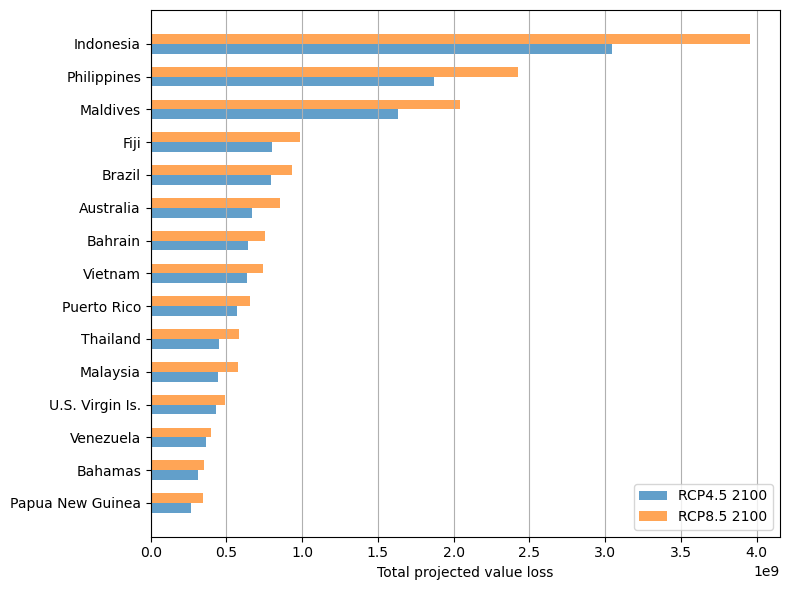

In [94]:
# TODO: why are these the same?

n = 15  # top n countries


# for each country, calculate the total projected
def delta_coral_cover_value(delta_cc, value):
    # a la Chen et al (2015), assume a 3.8% value loss per 1% coral cover loss
    loss = value * (1 - 0.038 * delta_cc)
    # bottom out at 0
    return np.maximum(loss, 0)


# Calculate projected value loss for both scenarios per site
total_tourism_value_gdf.loc[:, "projected_value_loss_rcp45"] = compound_value_loss(
    total_tourism_value_gdf["nearest_Y_future_RCP45_yr_2100_change"] * 100,
    total_tourism_value_gdf["approx_price_corrected"],
)
total_tourism_value_gdf.loc[:, "projected_value_loss_rcp85"] = compound_value_loss(
    total_tourism_value_gdf["nearest_Y_future_RCP85_yr_2100_change"] * 100,
    total_tourism_value_gdf["approx_price_corrected"],
)

# Aggregate (sum) projected losses per country for each scenario
total_value_loss_rcp45 = total_tourism_value_gdf.groupby("country")[
    "projected_value_loss_rcp45"
].sum()
total_value_loss_rcp85 = total_tourism_value_gdf.groupby("country")[
    "projected_value_loss_rcp85"
].sum()

# Find top n countries by total RCP8.5 value loss (most affected by worst scenario)
top_countries = total_value_loss_rcp85.sort_values(ascending=False).head(n).index

# Reverse so most affected at top
top_countries = top_countries[::-1]

ind = np.arange(n)
bar_height = 0.3

fig, ax = plt.subplots(figsize=(8, 6))

y_labels = list(top_countries)
ax.barh(
    ind - bar_height / 2,
    total_value_loss_rcp45.loc[top_countries],
    height=bar_height,
    label="RCP4.5 2100",
    color="tab:blue",
    alpha=0.7,
)
ax.barh(
    ind + bar_height / 2,
    total_value_loss_rcp85.loc[top_countries],
    height=bar_height,
    label="RCP8.5 2100",
    color="tab:orange",
    alpha=0.7,
)
ax.set_yticks(ind)
ax.set_yticklabels(y_labels)
ax.legend(loc="lower right")
ax.set_xlabel("Total projected value loss")
ax.grid(axis="x")
plt.tight_layout()
plt.show()


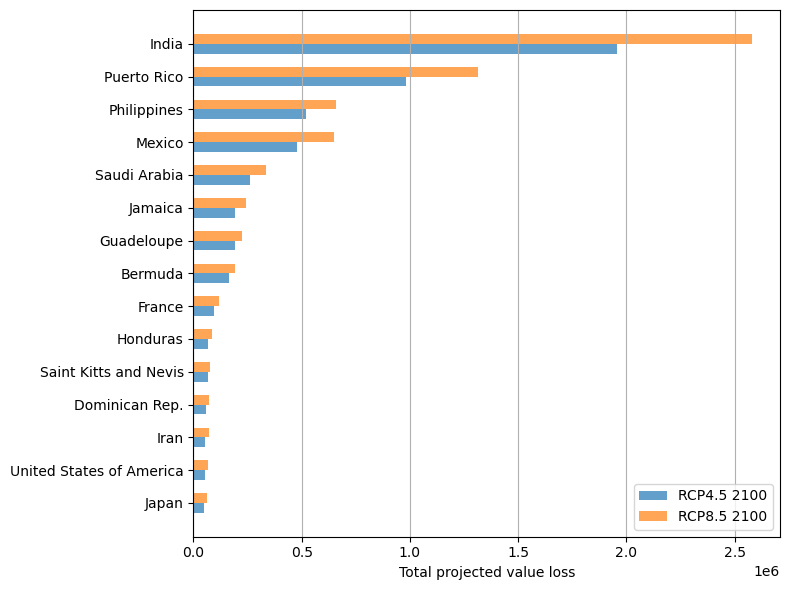

In [ ]:
# # TODO: why are these the same?

# n = 15  # top n countries


# # for each country, calculate the total projected
# def delta_coral_cover_value(delta_cc, value):
#     # a la Chen et al (2015), assume a 3.8% value loss per 1% coral cover loss
#     loss = value * (1 - 0.038 * delta_cc)
#     # bottom out at 0
#     return np.maximum(loss, 0)


# # Calculate projected value loss for both scenarios per site
# coral_cover_df.loc[:, "projected_value_loss_rcp45"] = compound_value_loss(
#     coral_cover_df["Y_future_RCP45_yr_2100_change"] * 100, coral_cover_df["nearest_gdp"]
# )
# coral_cover_df.loc[:, "projected_value_loss_rcp85"] = compound_value_loss(
#     coral_cover_df["Y_future_RCP85_yr_2100_change"] * 100, coral_cover_df["nearest_gdp"]
# )

# # Aggregate (sum) projected losses per country for each scenario
# total_value_loss_rcp45 = coral_cover_df.groupby("nearest_country")[
#     "projected_value_loss_rcp45"
# ].sum()
# total_value_loss_rcp85 = coral_cover_df.groupby("nearest_country")[
#     "projected_value_loss_rcp85"
# ].sum()

# # Find top n countries by total RCP8.5 value loss (most affected by worst scenario)
# top_countries = total_value_loss_rcp85.sort_values(ascending=False).head(n).index

# # Reverse so most affected at top
# top_countries = top_countries[::-1]

# ind = np.arange(n)
# bar_height = 0.3

# fig, ax = plt.subplots(figsize=(8, 6))

# y_labels = list(top_countries)
# ax.barh(
#     ind - bar_height / 2,
#     total_value_loss_rcp45.loc[top_countries],
#     height=bar_height,
#     label="RCP4.5 2100",
#     color="tab:blue",
#     alpha=0.7,
# )
# ax.barh(
#     ind + bar_height / 2,
#     total_value_loss_rcp85.loc[top_countries],
#     height=bar_height,
#     label="RCP8.5 2100",
#     color="tab:orange",
#     alpha=0.7,
# )
# ax.set_yticks(ind)
# ax.set_yticklabels(y_labels)
# ax.legend(loc="lower right")
# ax.set_xlabel("Total projected value loss")
# ax.grid(axis="x")
# plt.tight_layout()
# plt.show()